In [1]:
import polars as pl
import numpy as np
import pandas as pd
import seaborn as sns
# import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch
import os

In [2]:
plot_dir = "/zata/zippy/kresgeb/nmf_stuff/dlPFC/output/pattern_corr"

In [3]:
ds = pl.scan_parquet(
    "/zata/zippy/kresgeb/nmf_stuff/dlPFC/data/batched_nmf/all_patterns_partitioned"
)

df = (
    # ds.filter((pl.col("loading") > 0) & (pl.col("k") == 10))
    ds.filter((pl.col("loading") > 0) )
    .collect()
    .pivot(
        index=["run_id", "pattern"],
        on="gene",
        values="loading",
        aggregate_function="max",
    )  # Some genes have duplicate loading values (should not be the case but we will just take max in those cases)
    # See duplicates.ipynb for the discovery and exploration of those duplicates
    # UPDATE: duplicates come from using HGNC symbols instead of Ensembl IDs for genes (unique by Ensembl ID but not by symbol)
    # While I try to figure out how that happened, and how to fix it, this is a reasonable workaround
    .with_columns([pl.struct(["run_id", "pattern"]).hash().alias("pattern_uid")])
    .with_columns(
        pl.col("pattern_uid").rank(method="dense").cast(pl.UInt32).alias("row_idx") - 1
    )  # needs to be 0-indexed
    .drop("pattern_uid") # don't need this anymore, row_idx is unique identifier
    .fill_null(
        0
    )  # We can filter non-zero earlier for performance if we put them back here
    .sort("row_idx")
    .select([pl.col("row_idx"),pl.exclude("row_idx", "run_id", "pattern")])
)

df

row_idx,FBXL18,ACTB,FSCN1,RNF216,CCZ1,PMS2,AIMP2,EIF2AK1,USP42,CYTH3,RAC1,DAGLB,KDELR2,ZDHHC4,C7orf26,ZNF316,AC073343.2,ZNF12,CCZ1B,C1GALT1,COL28A1,MIOS,RPA3,UMAD1,GLCCI1,ICA1,NXPH1,AC004852.2,NDUFA4,PHF14,AC004160.1,THSD7A,TMEM106B,VWDE,SCIN,ARL4A,…,SP6,AC018521.3,AC018521.7,AC018521.5,AC018521.6,AC018521.2,PRR15L,AC018521.4,COPZ2,AC004477.1,AC004477.2,AC004477.3,SKAP1,SKAP1-AS1,THRA1/BTR,AC036222.1,HOXB2,HOXB-AS1,HOXB3,HOXB-AS3,HOXB4,AC103702.1,HOXB5,HOXB6,HOXB7,HOXB8,HOXB9,HOXB-AS4,AC103702.2,LINC02086,HOXB13,AC091133.1,GIP,IGF2BP1,AC091133.4,B4GALNT2,GNGT2
u32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000036,0.0,0.000083,0.0,0.0,0.0,0.0,0.0,0.000412,0.000111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000165,0.000266,0.000377,0.0,0.0,0.0,0.000328,0.0,0.0,0.000018,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002306,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00155,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.00005,0.0,0.000064,0.0,0.0,0.0,0.0,0.0,0.000308,0.00009,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000076,0.0,0.0,0.0,0.000174,0.000206,0.000569,0.0,0.0,0.0,0.000384,0.0,0.0,0.0,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
41245,0.000281,0.001329,0.000034,0.0,0.0,0.0,0.0,0.0,0.0,0.000055,0.000798,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000085,0.0,0.0,0.0,0.000827,0.0,0.0,0.0,0.0,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
41246,0.0,0.000599,0.000052,0.0,0.000026,0.000017,0.000007,0.000044,0.0,0.000049,0.000892,0.0,0.0,0.000036,0.000012,0.000066,0.000043,0.00006,0.00014,0.0,0.0,0.000029,0.000028,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00016,…,0.0,0.0,0.0,0.000081,0.0,0.0,0.0,0.0,0.000041,0.000001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.1573e-7,0.0,0.0,0.000002,0.0
41247,0.000012,0.0,7.6086e-7,0.000107,0.0,0.0,0.0,0.000005,0.000016,0.0,0.000137,0.000028,0.0,0.0,0.0,0.0,0.0,0.000008,0.0,0.000074,0.000046,0.0,0.0,0.000264,0.000551,0.000371,0.0,0.0,0.0,0.000168,0.0,0.0,0.000064,0.0,0.0,0.0,…,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
meta = (
    # ds.filter((pl.col("loading") > 0) & (pl.col("k") == 10))
    ds.filter((pl.col("loading") > 0) )
    .with_columns([pl.struct(["run_id", "pattern"]).hash().alias("pattern_uid")])
    .with_columns(
        pl.col("pattern_uid").rank(method="dense").cast(pl.UInt32).alias("row_idx") - 1
    )  # needs to be 0-indexed
    .drop("pattern_uid")  # don't need this anymore, row_idx is unique identifier
    .select("row_idx","run_id", "pattern", "k", "seed", "tol", "L1")
    .unique()
    .collect()
    .sort("row_idx")
)
meta

row_idx,run_id,pattern,k,seed,tol,L1
u32,i32,i32,i64,i32,f64,f64
0,649,64,90,2025,0.00001,0.7
1,452,9,20,42,0.00001,0.5
2,640,42,100,120301,0.00001,0.7
3,718,2,80,1029,0.0000001,0.7
4,715,50,50,1029,0.0000001,0.7
…,…,…,…,…,…,…
41245,139,25,90,120301,0.0000001,0.1
41246,269,36,90,1029,0.0000001,0.0
41247,420,49,100,1029,0.0000001,0.2


In [5]:
def add_metadata_legends(g, mappings, meta_vars,
                         x_offset=1.02,
                         y_top=1.0,
                         per_entry_height=0.035,
                         title_height=0.04,
                         block_padding=0.02,
                         fontsize=9):
    """
    Add stacked legend blocks to the right of a seaborn clustermap, supporting:

      - categorical vars  → patch legend
      - continuous vars    → colorbar with ticks

    `mappings[var]` should be either:
         {value -> color}  for categorical
    or:
         {"cmap": cmap, "norm": norm} for continuous
    """

    import matplotlib as mpl
    from matplotlib.patches import Patch

    # --- Expand figure to ensure enough space for legends ---
    w, h = g.fig.get_size_inches()
    g.fig.set_size_inches(w + 2.5, h)   # only add width

    y_cursor = y_top

    for var in meta_vars:
        mapping = mappings[var]

        # ------------------------------------------------------
        # CASE 1: CONTINUOUS VARIABLE → COLORBAR
        # ------------------------------------------------------
        if "cmap" in mapping and "norm" in mapping:
            cmap = mapping["cmap"]
            norm = mapping["norm"]

            # Create a tiny dummy mappable for the colorbar
            sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
            sm.set_array([])

            # Position the colorbar
            cax = g.fig.add_axes([x_offset, y_cursor - 0.15, 0.03, 0.12])

            cb = g.fig.colorbar(
                sm,
                cax=cax,
                orientation="vertical",
            )
            cb.ax.tick_params(labelsize=fontsize)
            cb.set_label(var, fontsize=fontsize)

            # Move cursor downward
            y_cursor -= (0.17 + block_padding)
            continue

        # ------------------------------------------------------
        # CASE 2: CATEGORICAL VARIABLE → PATCH LEGEND
        # ------------------------------------------------------
        values = list(mapping.keys())
        n_vals = len(values)

        block_height = title_height + n_vals * per_entry_height

        handles = [Patch(color=mapping[v], label=str(v)) for v in values]

        g.fig.legend(
            handles,
            values,
            title=var,
            loc="upper left",
            bbox_to_anchor=(x_offset, y_cursor),
            frameon=False,
            fontsize=fontsize,
            title_fontsize=fontsize,
            ncol=1,
            borderaxespad=0.0,
        )

        y_cursor -= (block_height + block_padding)

        # Safety if it overflows
        if y_cursor < 0:
            y_cursor = 0.02

In [ ]:
def make_pattern_plot(pattern_number, meta=meta, df=df, plot_dir=plot_dir):

    pattern_rows = meta.filter(pl.col("pattern") == pattern_number)["row_idx"].to_list()

    df_pattern = df.filter(pl.col("row_idx").is_in(pattern_rows))

    X = df_pattern.select(pl.exclude("row_idx")).to_numpy()

    corr = np.corrcoef(X)

    corr_df = pd.DataFrame(corr, index=pattern_rows, columns=pattern_rows)

    # ----- build colors for metadata -----
    # choose metadata variables to show
    meta_vars = ["L1", "seed", "tol"]  

    meta_rows = meta.filter(pl.col("pattern") == pattern_number).sort("row_idx")
    # Build palettes for each var
    color_df = pd.DataFrame(index=pattern_rows)

    mappings = {}

    for var in meta_vars:
        values = meta_rows[var].to_list()
        unique_vals = sorted(set(values))

        # categorical color palette
        palette = sns.color_palette("husl", len(unique_vals))
        mapping = dict(zip(unique_vals, palette))
        mappings[var] = mapping

        color_df[var] = [mapping[v] for v in values]

    # ----- plot -----
    g = sns.clustermap(
        corr_df,
        cmap="vlag",
        vmin=0,
        vmax=1,
        col_colors=color_df,
        # row_colors=color_df,
        xticklabels=False,
        yticklabels=False,
    )

    add_metadata_legends(g, mappings, meta_vars)

    g.savefig(f"{plot_dir}/pattern_{pattern_number}_corr_clustermap.pdf")
    # g.close()
    # plt.show(g)


In [7]:
# patterns = meta["pattern"].unique().to_list()
# patterns.sort()

# for p in patterns:
#     make_pattern_plot(p)

In [ ]:
k_vals = meta["k"].unique().to_list()
k_vals.sort()

for k in k_vals:
    plot_dir_k = f"{plot_dir}/k={k}"
    os.makedirs(plot_dir_k, exist_ok=True)
    meta_k = meta.filter(pl.col("k") == k)
    df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))
    patterns_k = meta_k["pattern"].unique().to_list()
    patterns_k.sort()
    for p in patterns_k:
        make_pattern_plot(p, meta=meta_k, df=df_k, plot_dir=plot_dir_k)

In [ ]:
def make_patterns_plot(meta=meta, df=df, plot_dir=plot_dir):

    rows = meta["row_idx"].to_list()


    X = df.select(pl.exclude("row_idx")).to_numpy()

    corr = np.corrcoef(X)

    corr_df = pd.DataFrame(corr, index=rows, columns=rows)

    # ----- build colors for metadata -----
    # choose metadata variables to show
    meta_vars = ["pattern", "L1", "seed", "tol"]  


    # Build palettes for each var
    color_df = pd.DataFrame(index=rows)

    mappings = {}

    for var in meta_vars:
        values = meta[var].to_list()
        unique_vals = sorted(set(values))
        
        # Heuristic for continuous vars:
        is_continuous = len(unique_vals) > 15

        if not is_continuous:
            # categorical color palette
            palette = sns.color_palette("husl", len(unique_vals))
            mapping = dict(zip(unique_vals, palette))
            mappings[var] = mapping

            color_df[var] = [mapping[v] for v in values]
        else:
            # CONTINUOUS: use a colormap
            cmap = sns.color_palette("viridis", as_cmap=True)
            norm = mpl.colors.Normalize(vmin=min(values), vmax=max(values))
            sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

            # Store RGB colors for each value
            color_df[var] = [sm.to_rgba(v) for v in values]

            # Store continuous legend info
            mappings[var] = {"cmap": cmap, "norm": norm}

    # ----- plot -----
    g = sns.clustermap(
        corr_df,
        cmap="vlag",
        vmin=0,
        vmax=1,
        col_colors=color_df,
        # row_colors=color_df,
        xticklabels=False,
        yticklabels=False,
    )

    add_metadata_legends(g, mappings, meta_vars)

    g.savefig(f"{plot_dir}/all_patterns_corr_clustermap.pdf")
    # g.close()
    # plt.close()
    # plt.show(g)


In [ ]:
def make_all_patterns_plot(meta=meta, df=df, plot_dir=plot_dir):

    rows = meta["row_idx"].to_list()

    X = df.select(pl.exclude("row_idx")).to_numpy()

    corr = np.corrcoef(X)

    corr_df = pd.DataFrame(corr, index=rows, columns=rows)

    # ----- build colors for metadata -----
    # choose metadata variables to show
    meta_vars = ["pattern", "k", "L1", "seed", "tol"]

    # Build palettes for each var
    color_df = pd.DataFrame(index=rows)

    mappings = {}

    for var in meta_vars:
        values = meta[var].to_list()
        unique_vals = sorted(set(values))

        # Heuristic for continuous vars:
        is_continuous = len(unique_vals) > 15

        if not is_continuous:
            # categorical color palette
            palette = sns.color_palette("husl", len(unique_vals))
            mapping = dict(zip(unique_vals, palette))
            mappings[var] = mapping

            color_df[var] = [mapping[v] for v in values]
        else:
            # CONTINUOUS: use a colormap
            cmap = sns.color_palette("viridis", as_cmap=True)
            norm = mpl.colors.Normalize(vmin=min(values), vmax=max(values))
            sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

            # Store RGB colors for each value
            color_df[var] = [sm.to_rgba(v) for v in values]

            # Store continuous legend info
            mappings[var] = {"cmap": cmap, "norm": norm}

    # ----- plot -----
    g = sns.clustermap(
        corr_df,
        cmap="vlag",
        vmin=0,
        vmax=1,
        col_colors=color_df,
        # row_colors=color_df,
        xticklabels=False,
        yticklabels=False,
    )

    add_metadata_legends(g, mappings, meta_vars)

    g.savefig(f"{plot_dir}/all_patterns_corr_clustermap.png")
    # plt.close()
    # plt.show(g)

In [ ]:
# make_all_patterns_plot()

Making correlation plot for k=10...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=20...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=30...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=40...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=50...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=60...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=70...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=80...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=90...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


Making correlation plot for k=100...


/tmp/ipykernel_332429/1353857951.py:9: DeprecationWarning: `is_in` with a collection of the same datatype is ambiguous and deprecated.
Please use `implode` to return to previous behavior.

See https://github.com/pola-rs/polars/issues/22149 for more information.
  df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))


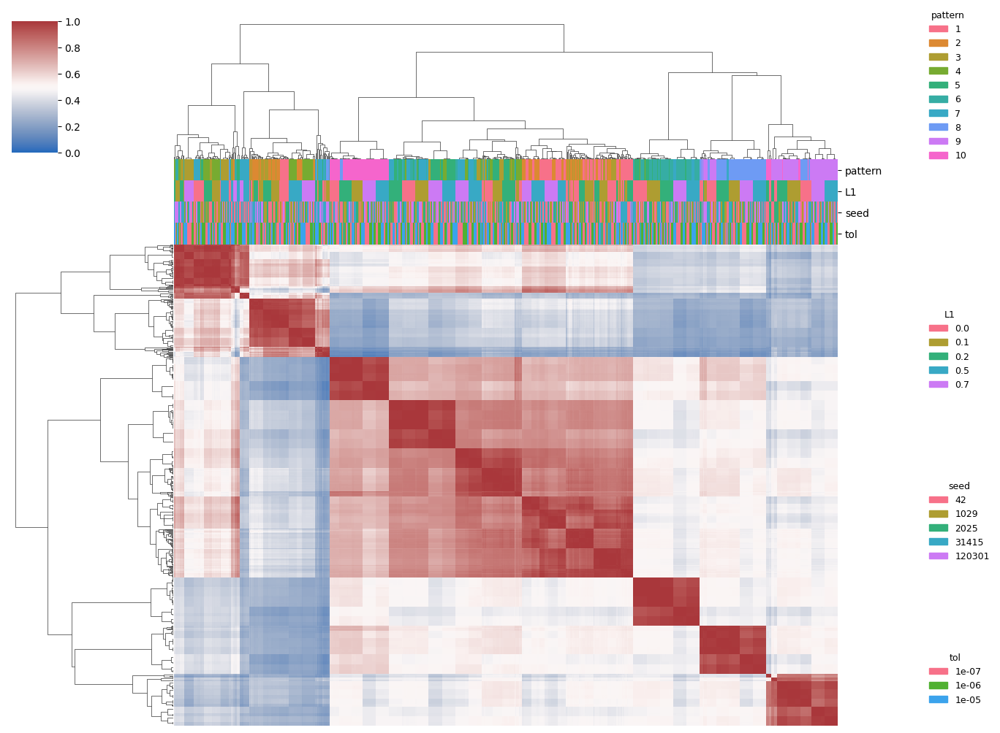

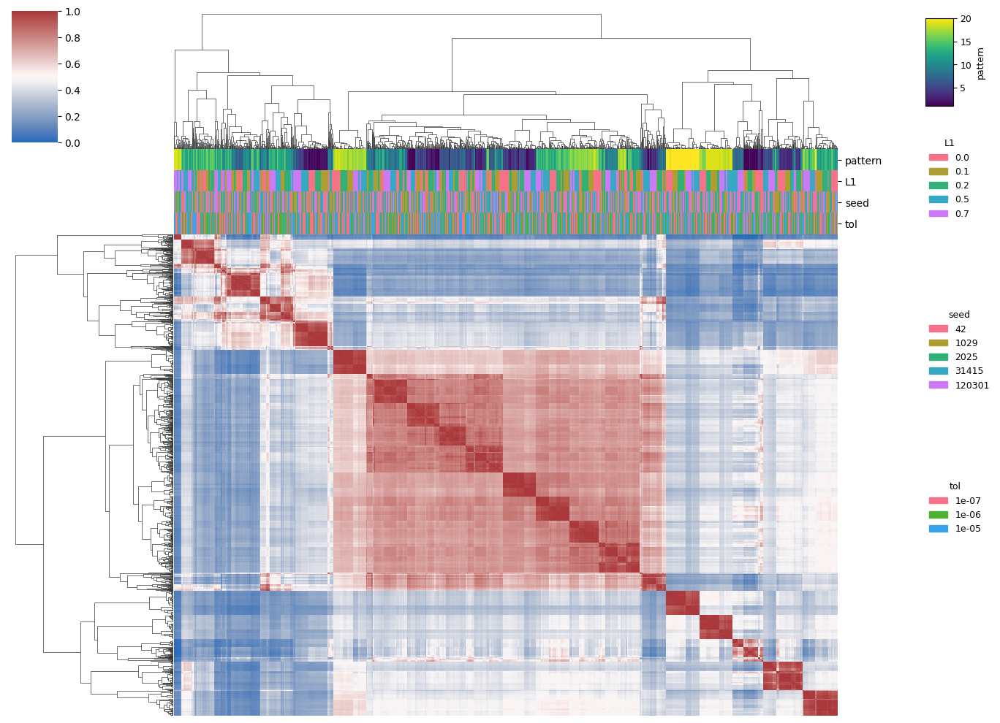

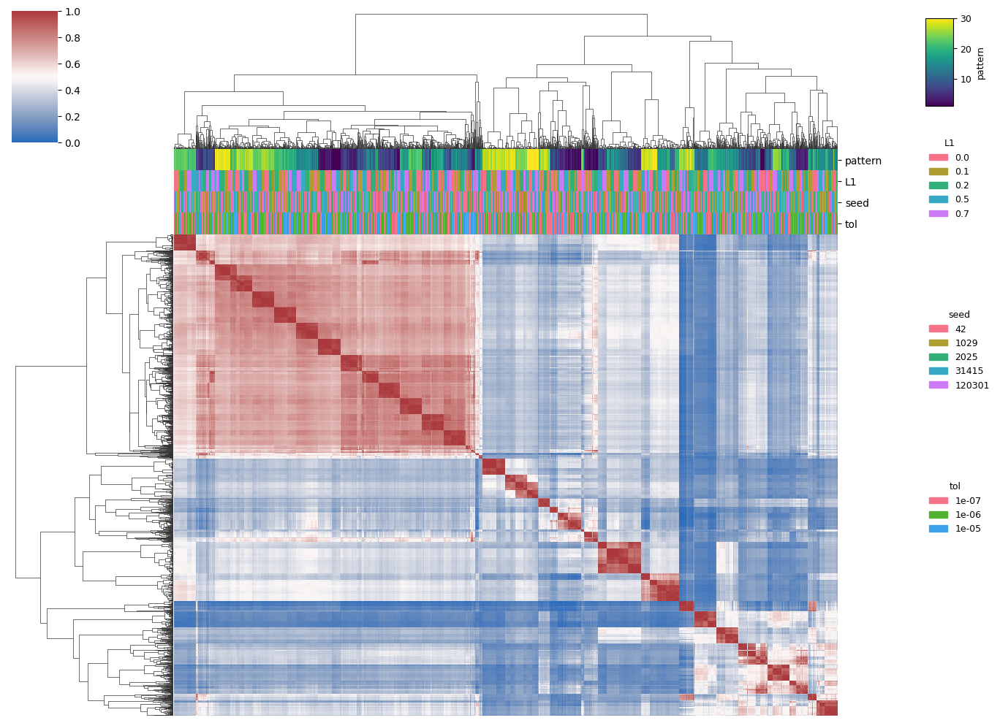

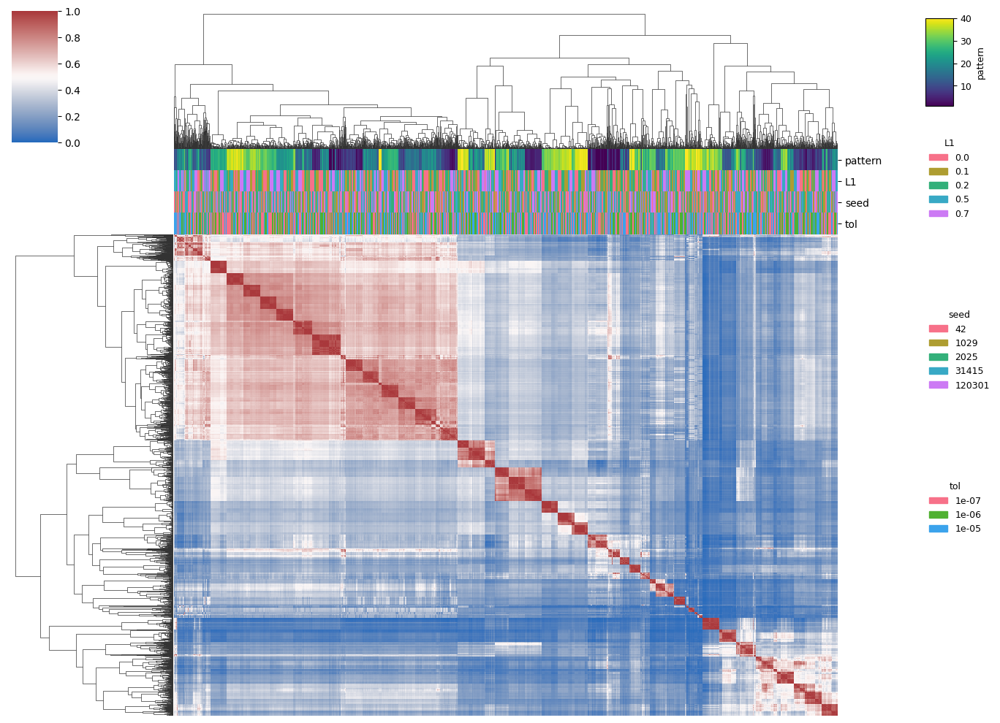

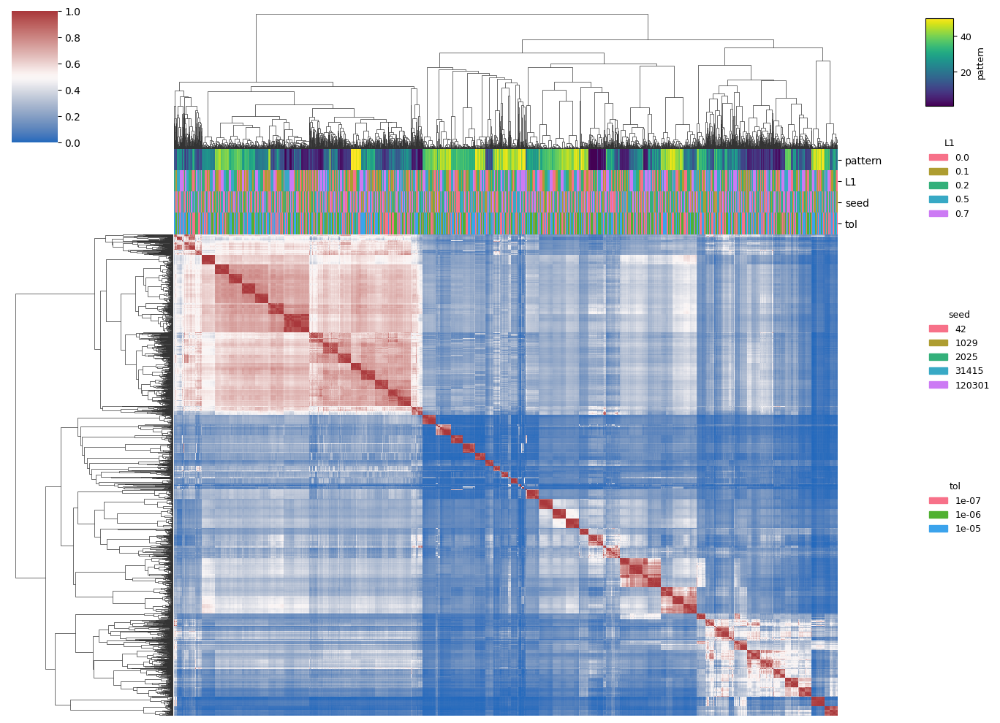

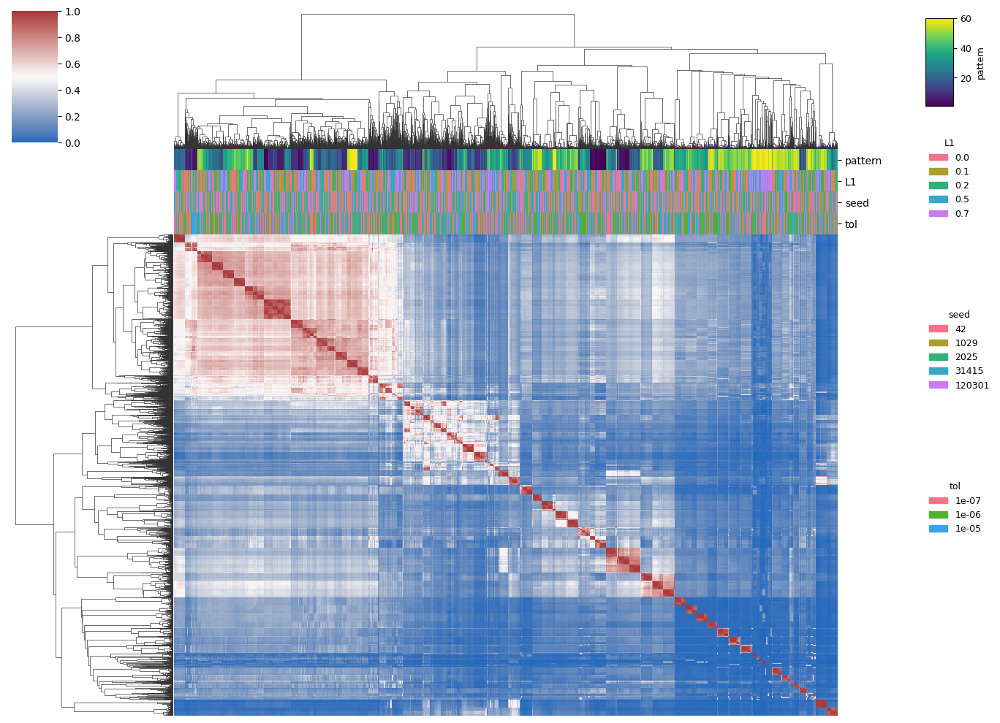

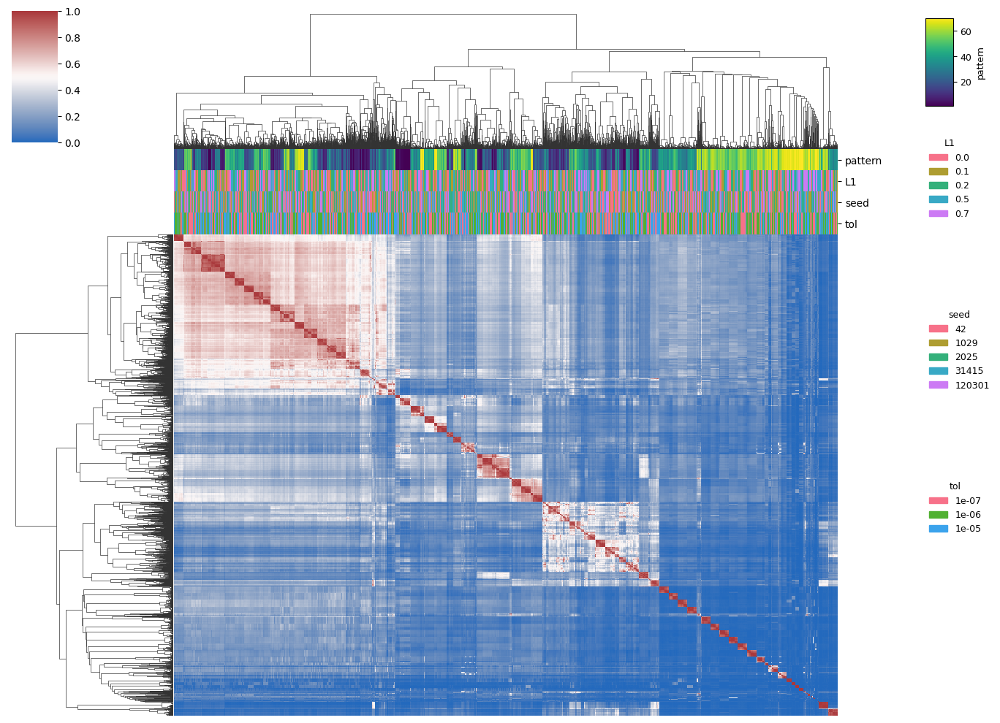

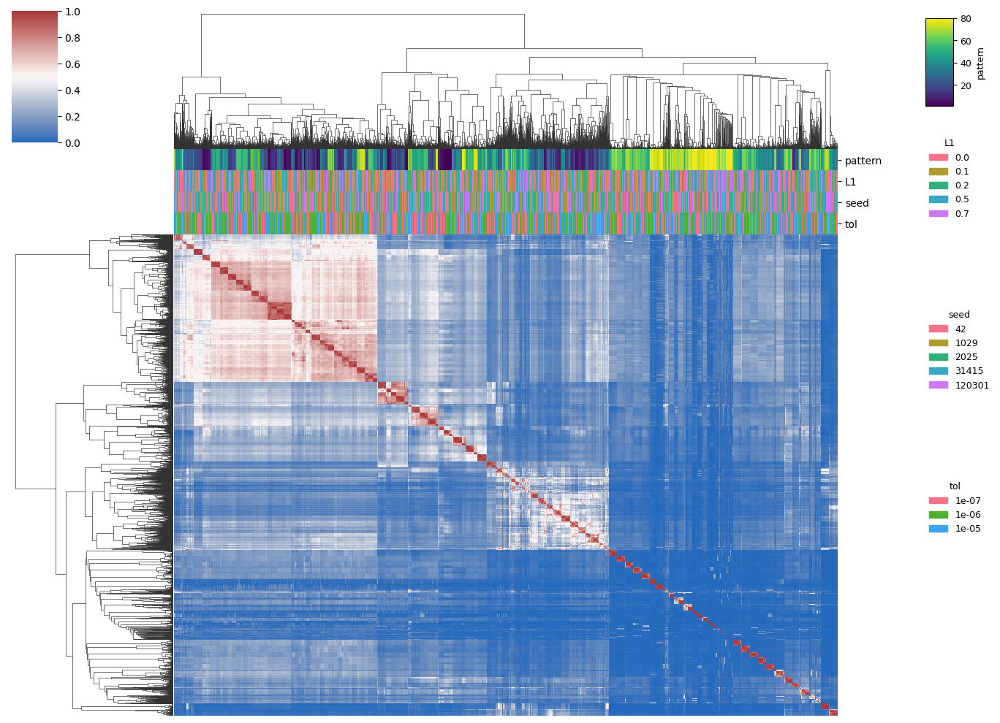

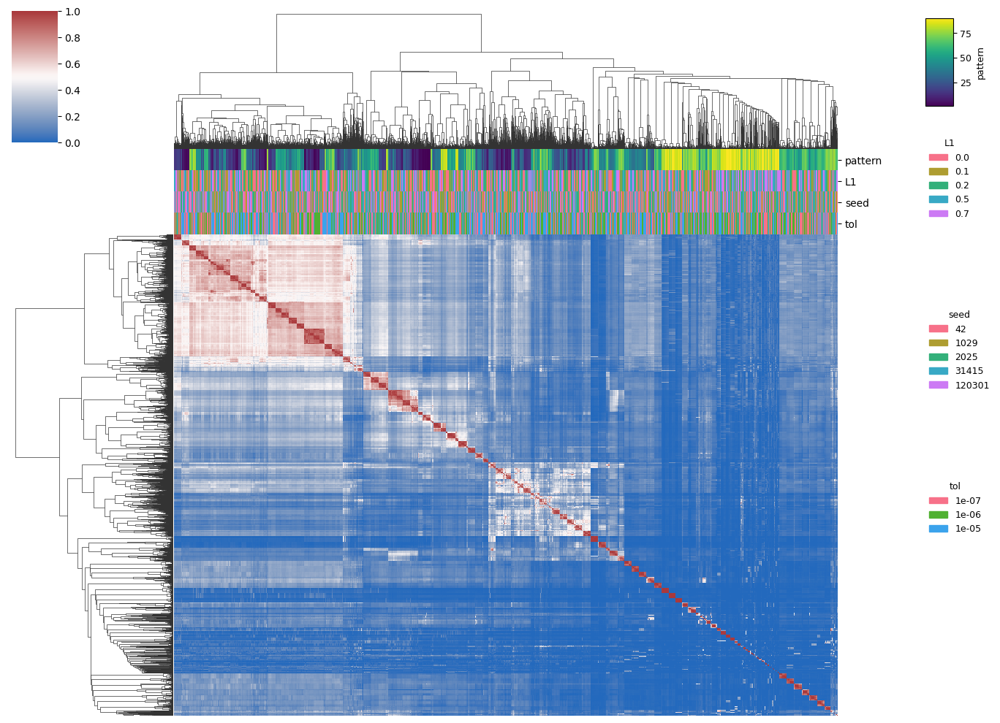

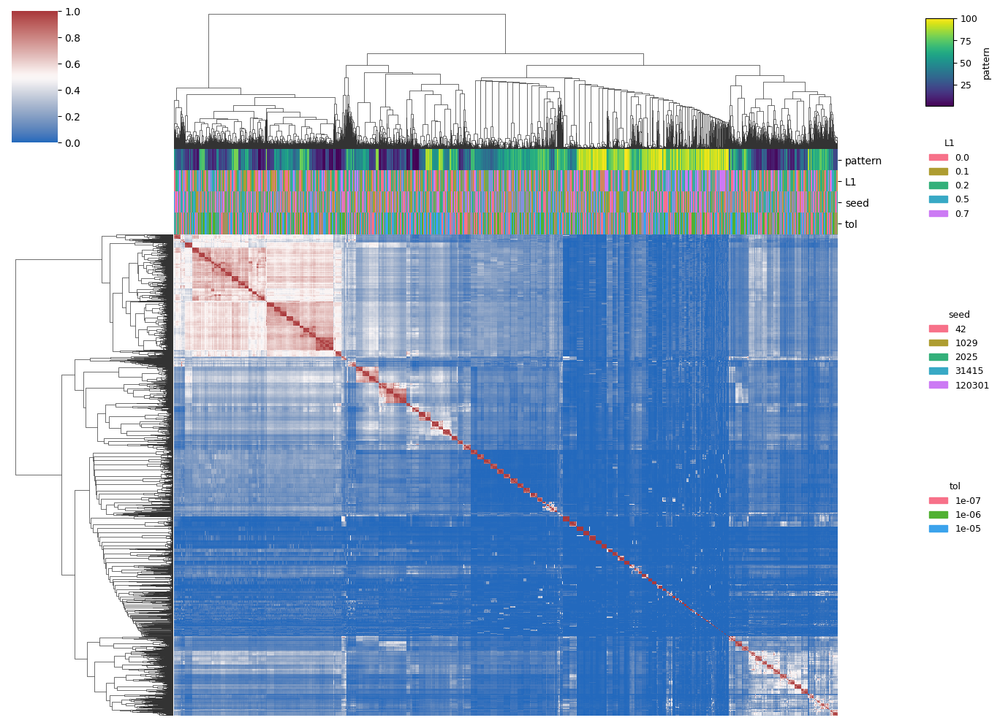

In [11]:
k_vals = meta["k"].unique().to_list()
k_vals.sort()

for k in k_vals:
    print(f"Making correlation plot for k={k}...")
    plot_dir_k = f"{plot_dir}/k={k}"
    os.makedirs(plot_dir_k, exist_ok=True)
    meta_k = meta.filter(pl.col("k") == k)
    df_k = df.filter(pl.col("row_idx").is_in(meta_k["row_idx"]))
    make_patterns_plot(meta=meta_k, df=df_k, plot_dir=plot_dir_k)